In [5]:
import matplotlib.pyplot as plt
import numpy as np
import corner
import astropy as ap
from astropy.io import fits
import astropy.io.fits as pyfits
from astropy.visualization import astropy_mpl_style
import pandas as pd
import math
import statistics
import scipy.ndimage as ndimage
import lenstronomy.Util.kernel_util as kernel_util
import lenstronomy.Plots.plot_util as plot_util
from lenstronomy.Util import util
from lenstronomy.PointSource.point_source import PointSource
from lenstronomy.Data.imaging_data import ImageData
from lenstronomy.Data.psf import PSF
from lenstronomy.Plots.model_plot import ModelPlot
from lenstronomy.Plots import chain_plot
from lenstronomy.Workflow.fitting_sequence import FittingSequence
from lenstronomy.Util import mask_util
from lenstronomy.ImSim.image_linear_solve import ImageLinearFit
from memory_profiler import memory_usage
plt.style.use(astropy_mpl_style)
%matplotlib inline

In [6]:
# define some useful functions

def get_data(filename):
    """
    Input: filename
    Output: data table and image array
    """
    hdu_list = fits.open(filename)
    data = pd.DataFrame(hdu_list[2].data)  # get dataframe data
    image = hdu_list['IMAGE'].data  # get image data
    hdu_list.close()  # close
    return data, image


def plot_image(image_array):
    """
    Input: image array
    Output: plot of image
    """
    fig, ax = plt.subplots()
    ax.imshow(image_array, origin='lower')
    ax.set_xticks([])
    ax.set_xticks([])
    ax.grid(False)
    plt.show()
    plt.close()


def approx_theta_E(center_x, center_y, x_images, y_images):
    """
    Input: Lens position (center_x, center_y) and image positions
    Output: estimated theta_E
    ** units must be in arcsec **
    """
    d = []

    for i in range(0, len(x_images)):
        x = float(x_images[i])
        y = float(y_images[i])
        x = center_x - x
        y = center_y - y
        dist = math.sqrt(x ** 2 + y ** 2)
        d.append(dist)

    theta_E = statistics.mean(d)
    print(f"'Estimated theta_E': {round(theta_E,2)}")
    return theta_E

def set_pixel_psf(coadd_id, band_index):
    """
    Input: coadd_id and band_index (g=0, r=1, i=2)
    Output: PIXEL psf model from fits file
    """
    # get data from fits file
    psf_filename = filepath + 'stars.fits'  # psf model from near field star
    psf_data, psf_image = get_data(psf_filename)

    # index by candidate's coadd_id
    psf_row = psf_data[psf_data['COADD_OBJECT_ID_CAND'] == coadd_id].index[0]  

    # crop kernel to odd number
    kernel = psf_image[psf_row, band_index, 0:45, 0:45]
    kernel_centered = kernel_util.center_kernel(kernel, iterations=20)
    kernel_nice = kernel_util.pixel_kernel(kernel_centered, subgrid_res=7)

    kernel_size = 13
    kernel_cut = kernel_util.cut_psf(kernel_centered, kernel_size)
    kwargs_psf = {'psf_type': 'PIXEL', 'pixel_size': deltaPix, 'kernel_point_source': kernel_cut}
    plot_image(kernel_cut)
    return kwargs_psf


# plot the observerd, reconstructed, and residuals for G,R,I bands
def model_plot_all_bands(modelPlot):
    """
    Input: modelPlot = ModelPlot(multi_band_list, kwargs_model, kwargs_result,
                                 arrow_size=0.02, cmap_string="gist_heat")
    Output: 3x3 figure where each row is a band (G,R,I) and
            columns are observed, reconstructed, and normalized residuals
    """
    f, axes = plt.subplots(3, 3, figsize=(12, 12))  # 3x3 fig
    # set row names: names must be in same order as multi_band_list
    band_names = ['G', 'R', 'I']
    for index, band_name in enumerate(band_names):
        axes[index, 0].set_title(str(band_name)+'-Band')
        modelPlot.data_plot(ax=axes[index, 0], band_index=index)
        # image_names=False hides image points
        modelPlot.model_plot(ax=axes[index, 1],
                             image_names=True, band_index=index)
        modelPlot.normalized_residual_plot(ax=axes[index, 2],
                                           v_min=-6, v_max=6,
                                           band_index=index)
    plt.show()
    plt.close()

In [7]:
# set filename
filepath = '/Users/gilliancartwright/Desktop/DES data/'  # personal file path
filename = filepath + 'Rob_candidates.fits'  # using Y6 data
psf_file = filepath + 'stars.fits'

# show data table for reference
data, image = get_data(filename)
data.head(3)

,COADD_OBJECT_ID,TILENAME,HPIX_16384,HPIX_4096,DNF_ZMEAN_SOF,RA,DEC,FLUX_RADIUS_G,FLUX_RADIUS_R,FLUX_RADIUS_I,...,FWHM_WMEAN_G,FWHM_WMEAN_R,FWHM_WMEAN_I,FWHM_WMEAN_Z,SKYBRITE_WMEAN_G,SKYBRITE_WMEAN_R,SKYBRITE_WMEAN_I,SKYBRITE_WMEAN_Z,NAME,NAME_FOLDER
0,1400263522,DES0336-2915,2354916223,147182263,0.938449,53.898900,-28.912203,3.962615,4.879757,4.983489,...,1.09654,0.943639,0.817035,0.899360,390.652008,947.728027,3299.189941,7099.970215,DES-691022126,DES0336-2915
1,1325853948,DES0242-0041,1163420627,72713789,0.006323,40.969310,-0.619002,10.245866,10.665524,11.179090,...,1.09442,0.956736,0.894366,0.889644,459.313995,1283.849976,3451.110107,8414.360352,DES-701263907,DES0242-0041
2,1087262176,DES0038-4414,2318857161,144928572,0.545765,10.155908,-44.437518,5.865641,5.180269,5.163048,...,1.28928,1.035290,1.025070,0.777657,406.477997,1063.030029,2966.409912,8586.750000,DES-699919273,DES0038-4414


In [3]:
# DES camera specifics
background_rms = 7.  # background noise per pixel (this is not correct! need to get actual background RMS)
exp_time = 90.  # exposure time
numPix = 46  # number of pixels in image
deltaPix = 0.2637  # pixel size in arcsec

In [34]:
# MODEL
def model(coadd_id, kwargs_lens_initial, kwargs_light_initial,
          x_images, y_images, psf_type):
    """
    INPUT: coadd_id, initial lens mass and light model params,
           and positions in arcsec of images
    OUTPUT: RGB image,
            observed image, modeled image, residuals plot, (each band)
            and results of PSO and MCMC fitting
    """
    # Image data
    data, image = get_data(filename)
    # index data frame by coadd_id
    row = data[data['COADD_OBJECT_ID'] == coadd_id].index[0]

    g = image[row, 0, :, :] # get image array
    r = image[row, 1, :, :]
    i = image[row, 2, :, :]

    fwhm_g = data.iloc[row, 27] # get fwhm
    fwhm_r = data.iloc[row, 28]
    fwhm_i = data.iloc[row, 29]

    # set models to use
    # input for point source is image positions, not source position
    lens_model_list = ['SIE']
    lens_light_model_list = ['SERSIC_ELLIPSE']
    point_source_list = ['LENSED_POSITION']

    # generate coordinate grid and image properties
    _, _, ra_at_xy_0, dec_at_xy_0, _, _, Mpix2coord, _ = util.make_grid_with_coordtransform(numPix, deltaPix, subgrid_res=1, center_ra=0, center_dec=0, inverse=False)

    # generate image data for each band
    kwargs_data_g = {'background_rms': background_rms-4,  # the -4 is an approximation until I have the actual background RMS
                     'exposure_time': exp_time,  # from DES camera
                     'ra_at_xy_0': ra_at_xy_0,
                     'dec_at_xy_0': dec_at_xy_0,
                     'transform_pix2angle': Mpix2coord,  # coords in ra, dec
                     'image_data': g}  # 2d image array

    kwargs_data_r = {'background_rms': background_rms-2,  # the -2 is an approximation until I have the actual background RMS
                     'exposure_time': exp_time,
                     'ra_at_xy_0': ra_at_xy_0,
                     'dec_at_xy_0': dec_at_xy_0,
                     'transform_pix2angle': Mpix2coord,
                     'image_data': r}

    kwargs_data_i = {'background_rms': background_rms,  # this background_rms may be incorrect as well!
                     'exposure_time': exp_time,
                     'ra_at_xy_0': ra_at_xy_0,
                     'dec_at_xy_0': dec_at_xy_0,
                     'transform_pix2angle': Mpix2coord,
                     'image_data': i}

    # set kwargs_psf depending on psf_type
    if psf_type == 'GAUSSIAN':
        kwargs_psf_g = {'psf_type': 'GAUSSIAN', 'fwhm': fwhm_g,
                        'pixel_size': deltaPix, 'truncation': 4}
        kwargs_psf_r = {'psf_type': 'GAUSSIAN', 'fwhm': fwhm_r,
                        'pixel_size': deltaPix, 'truncation': 4}
        kwargs_psf_i = {'psf_type': 'GAUSSIAN', 'fwhm': fwhm_i,
                        'pixel_size': deltaPix, 'truncation': 4}

    # psf from near field bright star
    elif psf_type == 'PIXEL':
        kwargs_psf_g = set_pixel_psf(coadd_id, 0)
        kwargs_psf_r = set_pixel_psf(coadd_id, 1)
        kwargs_psf_i = set_pixel_psf(coadd_id, 2)

    else:
        print("Invalid psf_type. Choose 'GAUSSIAN' or 'PIXEL'.")

    # Settings for model
    kwargs_numerics = {'supersampling_factor': 1,
                       'supersampling_convolution': False}

    # combine models
    kwargs_model = {'lens_model_list': lens_model_list,
                    'lens_light_model_list': lens_light_model_list,
                    'point_source_model_list': point_source_list,
                    'additional_images_list': [False],
                    'fixed_magnification_list': [False]}  # not modeling flux ratios here

    num_images = len(x_images)  # number of images
    kwargs_constraints = {'num_point_source_list': [num_images]}
    # see lenstronomy_extensions: quad modeling for more info on likelihood
    kwargs_likelihood = {'check_bounds': True,
                         'force_no_add_image': False,
                         'source_marg': False,
                         'image_position_uncertainty': 0.004,
                         'check_matched_source_position': True,
                         'source_position_tolerance': 0.001,
                         'source_position_sigma': 0.001}  


    # Combine bands for modeling
    g_band = [kwargs_data_g, kwargs_psf_g, kwargs_numerics]
    r_band = [kwargs_data_r, kwargs_psf_r, kwargs_numerics]
    i_band = [kwargs_data_i, kwargs_psf_i, kwargs_numerics]
    multi_band_list = [i_band, r_band, g_band]
    kwargs_data_joint = {'multi_band_list': multi_band_list,
                         'multi_band_type': 'multi-linear'}

    # Add parameters to model:
    # lens
    kwargs_lens_fixed = [{}]  # fixed parameters
    kwargs_lens_init = [kwargs_lens_initial]  # initial input
    kwargs_lens_sigma = [{'theta_E': 0.2, 'e1': 0.1, 'e2': 0.1,
                          'center_x': 0.01, 'center_y': 0.01}]  # step sizes
    kwargs_lower_lens = [{'theta_E': theta_E - 0.7, 'e1': -0.5, 'e2': -0.5,
                          'center_x': center_x - 0.1, 'center_y': center_y-0.1}]  # lower bounds
    kwargs_upper_lens = [{'theta_E': theta_E + 0.7, 'e1': 0.5, 'e2': 0.5,
                          'center_x': center_x + 0.1, 'center_y': center_y+0.1}]  # upper bounds

    # lens light
    kwargs_lens_light_fixed = [{}]
    kwargs_lens_light_init = [kwargs_light_initial]
    kwargs_lens_light_sigma = [{'R_sersic': 0.1, 'n_sersic': 0.1,
                                'e1': 0.1, 'e2': 0.1,
                                'center_x': 0.01, 'center_y': 0.01}]
    kwargs_lower_lens_light = [{'R_sersic': 0.05, 'n_sersic': 0.5,
                                'e1': -0.5, 'e2': -0.5,
                                'center_x': center_x-0.1, 'center_y': center_y-0.1}]
    kwargs_upper_lens_light = [{'R_sersic': 10, 'n_sersic': 5.,
                                'e1': 0.5, 'e2': 0.5,
                                'center_x': center_x+0.1, 'center_y': center_y+0.1}]

    # point source image positions
    fixed_ps = [{}]
    kwargs_ps_init = [{'ra_image': x_images,'dec_image': y_images}]
    kwargs_ps_sigma = [{'ra_image': [0.01] * num_images,
                        'dec_image': [0.01] * num_images}]
    kwargs_lower_ps = [{'ra_image': [i-0.1 for i in x_images],
                        'dec_image': [i-0.1 for i in y_images]}]
    kwargs_upper_ps = [{'ra_image': [i+0.1 for i in x_images],
                        'dec_image': [i+0.1 for i in y_images]}]

    # combine params
    lens_params = [kwargs_lens_init,
                   kwargs_lens_sigma,
                   kwargs_lens_fixed,
                   kwargs_lower_lens,
                   kwargs_upper_lens]

    lens_light_params = [kwargs_lens_light_init,
                         kwargs_lens_light_sigma,
                         kwargs_lens_light_fixed,
                         kwargs_lower_lens_light,
                         kwargs_upper_lens_light]

    ps_params = [kwargs_ps_init,
                 kwargs_ps_sigma,
                 fixed_ps,
                 kwargs_lower_ps,
                 kwargs_upper_ps]

    kwargs_params = {'lens_model': lens_params,
                     'lens_light_model': lens_light_params,
                     'point_source_model': ps_params}

    # Fitting
    fitting_seq = FittingSequence(kwargs_data_joint,
                                  kwargs_model,
                                  kwargs_constraints,
                                  kwargs_likelihood,
                                  kwargs_params)

    fitting_kwargs_list = [['PSO', {'sigma_scale': 1.,
                                    'n_particles': 600,
                                    'n_iterations': 600}],
                           ['MCMC', {'n_burn': 200,
                                     'n_run': 600,
                                     'walkerRatio': 10,
                                     'sigma_scale': .1}]]

    chain_list = fitting_seq.fit_sequence(fitting_kwargs_list)
    kwargs_result = fitting_seq.best_fit()

    # Show final results
    modelPlot = ModelPlot(multi_band_list, kwargs_model, kwargs_result,
                          arrow_size=0.02, cmap_string="gist_heat")

    # plot RGB image
    rgb_image = ap.visualization.make_lupton_rgb(i, r, g, stretch=50, Q=10)
    plot_image(rgb_image)

    # plot observed, reconstructed, and residual plots for each band
    model_plot_all_bands(modelPlot)

    # Results of MCMC chain
    sampler_type, samples_mcmc, param_mcmc, dist_mcmc = chain_list[1]
    for i in range(len(chain_list)):
        chain_plot.plot_chain_list(chain_list, i)

    print("number of non-linear parameters in the MCMC process: ", len(param_mcmc))
    print("parameters in order: ", param_mcmc)
    print("number of evaluations in the MCMC process: ", np.shape(samples_mcmc)[0])
    n_sample = len(samples_mcmc)
    print(n_sample)
    samples_mcmc_cut = samples_mcmc[int(n_sample * 1/2.):]

    n, num_param = np.shape(samples_mcmc_cut)
    plot = corner.corner(samples_mcmc_cut[:, :], labels=param_mcmc[:], show_titles=True)

    # summary of input positions vs. results from model
    print('Measured Positions: ')
    print(f"center: ({center_x}, {center_y})")
    print(f'ra_images: {x_images} ')
    print(f'dec_images: {y_images}')
    print('===============================')
    print('Result Positions: ')
    print(f"center: ({round(kwargs_result.get('kwargs_lens')[0].get('center_x'), 2)}, {round(kwargs_result.get('kwargs_lens')[0].get('center_y'), 2)})")
    print(f"ra_images: {np.around(kwargs_result.get('kwargs_ps')[0].get('ra_image'), 2)}")
    print(f"dec_images: {np.around(kwargs_result.get('kwargs_ps')[0].get('dec_image'), 2)}")

In [49]:
psf_type = 'PIXEL'

'Estimated theta_E': 2.06


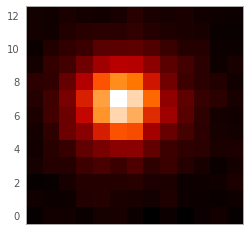

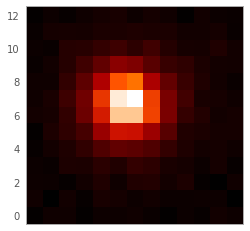

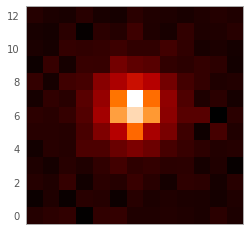

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
Max iteration reached! Stopping.
-4.317722558553357 reduced X^2 of best position
-13641.844423749331 logL
6319.0 effective number of data points
[{'theta_E': 2.1162992027357648, 'e1': -0.030325403417900205, 'e2': 0.0323602341849009, 'center_x': 1.5802376888428151, 'center_y': -1.2310021554634551}] lens result
[] source result
[{'amp': 1, 'R_sersic': 0.7405927412471733, 'n_sersic': 4.9999994253034235, 'e1': 0.16321495488752424, 'e2': -0.19069511116600904, 'center_x': 1.5800002433621074, 'center_y': -1.4309999794793855}] lens light result
[{'ra_image': array([-2.25225243e-02, -9.84204339e-04,  3.67572073e+00]), 'dec_image': array([ 0.10100136, -2.54199997, -1.94306875]), 'point_amp': array([1., 1., 1.])}] point source result
{} special par

100%|█████████████████████████████████████████| 800/800 [06:37<00:00,  2.01it/s]

Computing the MCMC...
Number of walkers =  170
Burn-in iterations:  200
Sampling iterations (in current run): 800
398.57890009880066 time taken for MCMC sampling
-4.301461169067066 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  8.74604556111367
reduced chi^2 of data  1 =  3.514608477501608
reduced chi^2 of data  2 =  0.6437294685859192


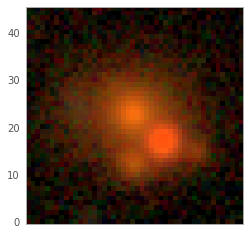

/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',


number of non-linear parameters in the MCMC process:  17
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'ra_image', 'dec_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  102000
102000


Measured Positions: 
center: (1.68, -1.331)
ra_images: [0.068, 0.099, 3.623] 
dec_images: [0.201, -2.442, -1.878]
Result Positions: 
center: (1.58, -1.23)
ra_images: [-0.02 -0.    3.68]
dec_images: [ 0.1  -2.54 -1.94]
Total Memory Usage: 740.51171875


<Figure size 648x648 with 0 Axes>

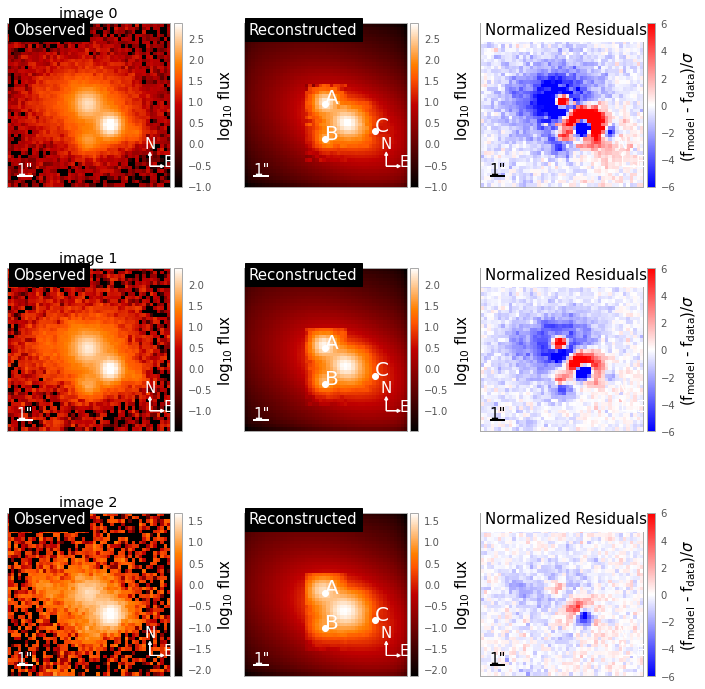

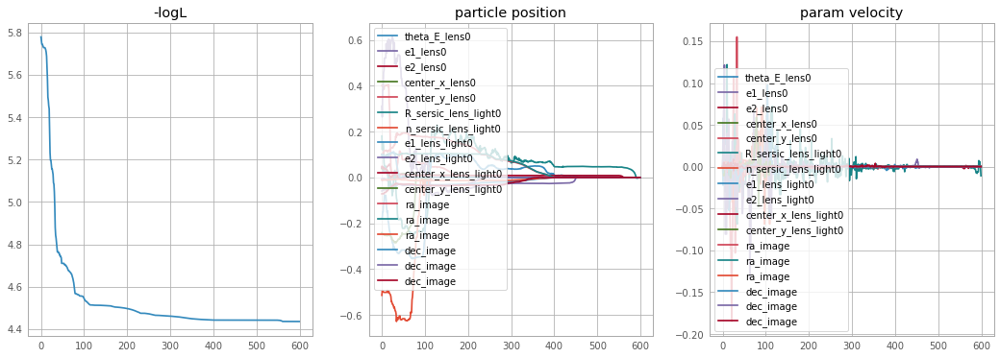

<Figure size 432x288 with 0 Axes>

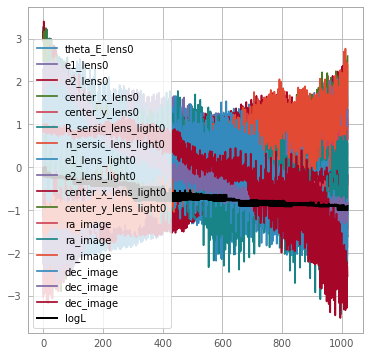

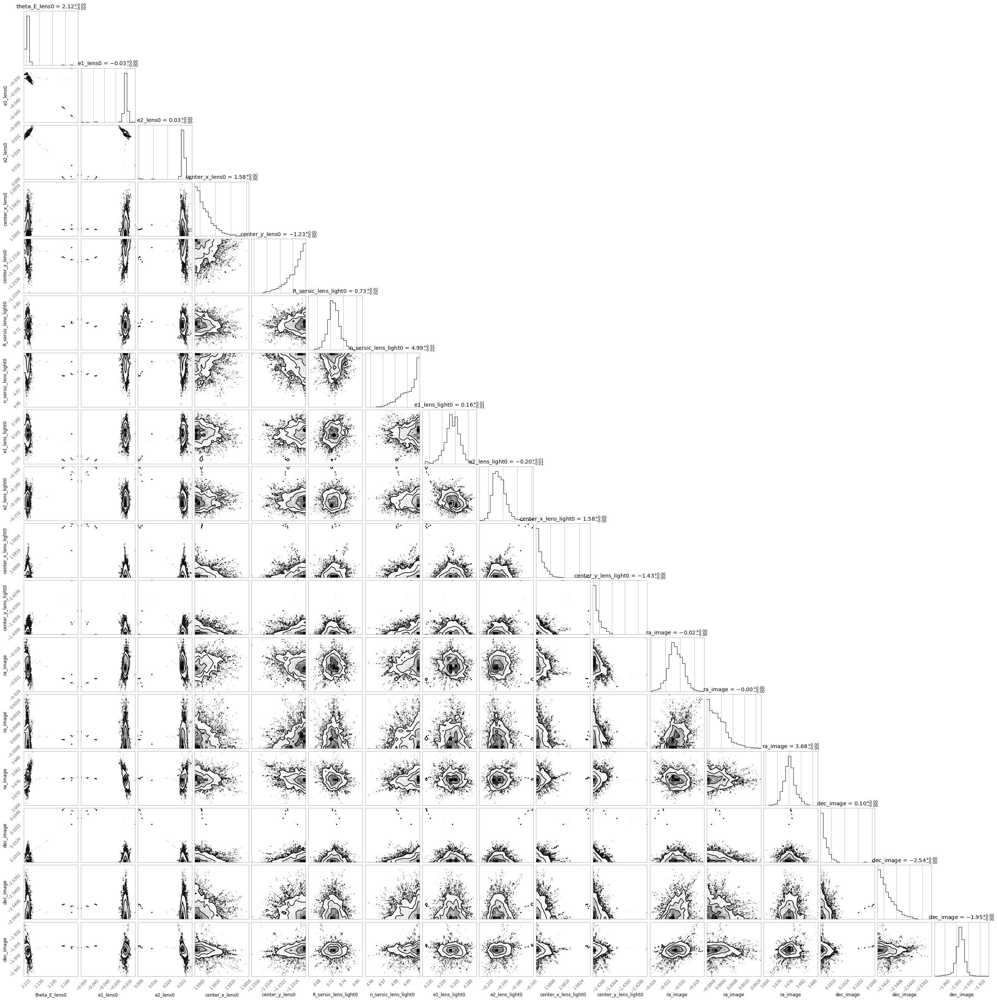

In [36]:
# DES_4414, coadd_id = 1087262176

# lens position:
center_x = 1.68
center_y = -1.331

# image positions, measured
x_images = [0.068, 0.099, 3.623]
y_images = [0.201, -2.442, -1.878]

# initial guesses for params
theta_E = approx_theta_E(center_x, center_y, x_images, y_images)

kwargs_lens_initial = {'theta_E': theta_E, 'e1': 0., 'e2': 0,
                       'center_x': center_x, 'center_y': center_y}
kwargs_light_initial = {'R_sersic': 1, 'n_sersic': 2, 'e1': 0,
                        'e2': 0, 'center_x': center_x, 'center_y': center_y}

# run model with memory tracker
mem_usage = memory_usage((model, (1087262176,
                                  kwargs_lens_initial,
                                  kwargs_light_initial,
                                  x_images, y_images, psf_type), ))

print(f"Total Memory Usage: {mem_usage[-1]}")
print("================================================================")

### Summary: 
* PIXEL psf model
* lens mass and light position vary within +-0.1 arcsec
* image positions vary for image positions is +- 0.1 arcsec
* PSO did not converge
    * 600 particles, 600 iterations
    * time taken = 14.5 min
* MCMC: 
    * 200 burn, 600 run, 10 walkerRatio
    * time taken = 6.5 min
    * num of free params: 17
* total memory: 740
* total time: 21 min

'Estimated theta_E': 1.67


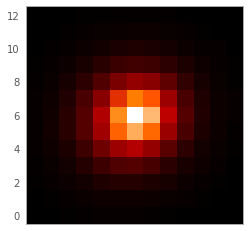

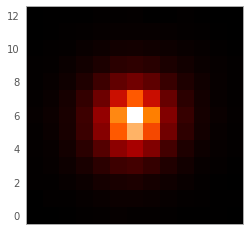

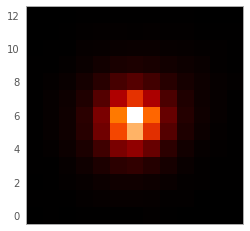

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
Max iteration reached! Stopping.
-3.303809799520962 reduced X^2 of best position
-10438.38706158648 logL
6319.0 effective number of data points
[{'theta_E': 1.6935508264205785, 'e1': 0.08366335284748734, 'e2': 0.20765342429992303, 'center_x': 0.3509995890836761, 'center_y': 0.0040001282981845234}] lens result
[] source result
[{'amp': 1, 'R_sersic': 1.4321894699825386, 'n_sersic': 2.421725898399964, 'e1': -0.24782647984718228, 'e2': 0.07263927222498733, 'center_x': 0.15104205233454934, 'center_y': 0.11677542228748569}] lens light result
[{'ra_image': array([-0.71799979,  0.27400012,  1.97999971]), 'dec_image': array([-0.76300039,  1.79937639, -0.98300003]), 'point_amp': array([1., 1., 1.])}] point source result
{} special param result
11

100%|█████████████████████████████████████████| 800/800 [08:04<00:00,  1.65it/s]

Computing the MCMC...
Number of walkers =  170
Burn-in iterations:  200
Sampling iterations (in current run): 800
485.9926688671112 time taken for MCMC sampling
-0.3723475394052924 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.4464305518109168
reduced chi^2 of data  1 =  0.24143727493855688
reduced chi^2 of data  2 =  0.42917479146640364



/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:43: RuntimeWarning: invalid value encountered in log10
  log_model = np.log10(model)


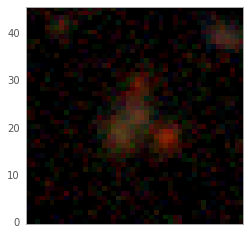

/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',
/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:136: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._model), origin='lower', vmin=v_min, vmax=v_max,


number of non-linear parameters in the MCMC process:  17
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'ra_image', 'dec_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  102000
102000
Measured Positions: 
center: (0.251, 0.104)
ra_images: [-0.618, 0.374, 1.88] 
dec_images: [-0.863, 1.795, -1.083]
Result Positions: 
center: (0.35, 0.0)
ra_images: [-0.72  0.27  1.98]
dec_images: [-0.76  1.8  -0.98]
Total Memory Usage: 715.01953125


<Figure size 648x648 with 0 Axes>

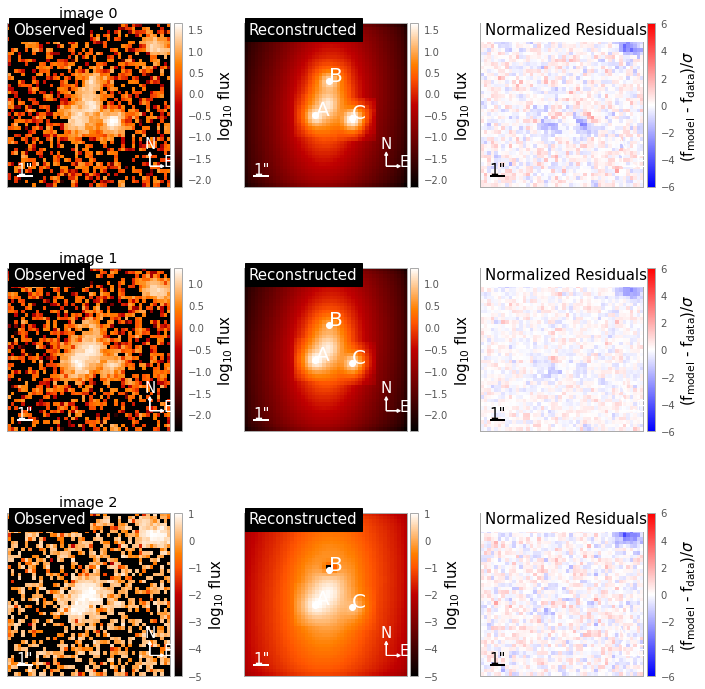

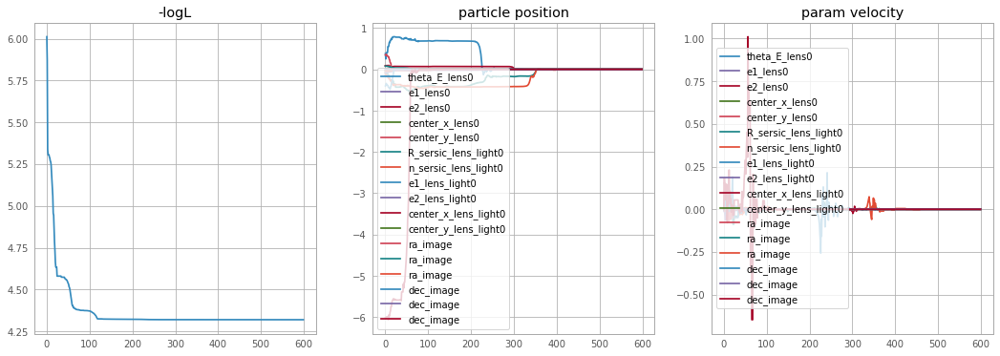

<Figure size 432x288 with 0 Axes>

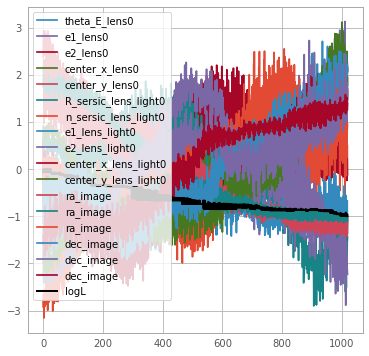

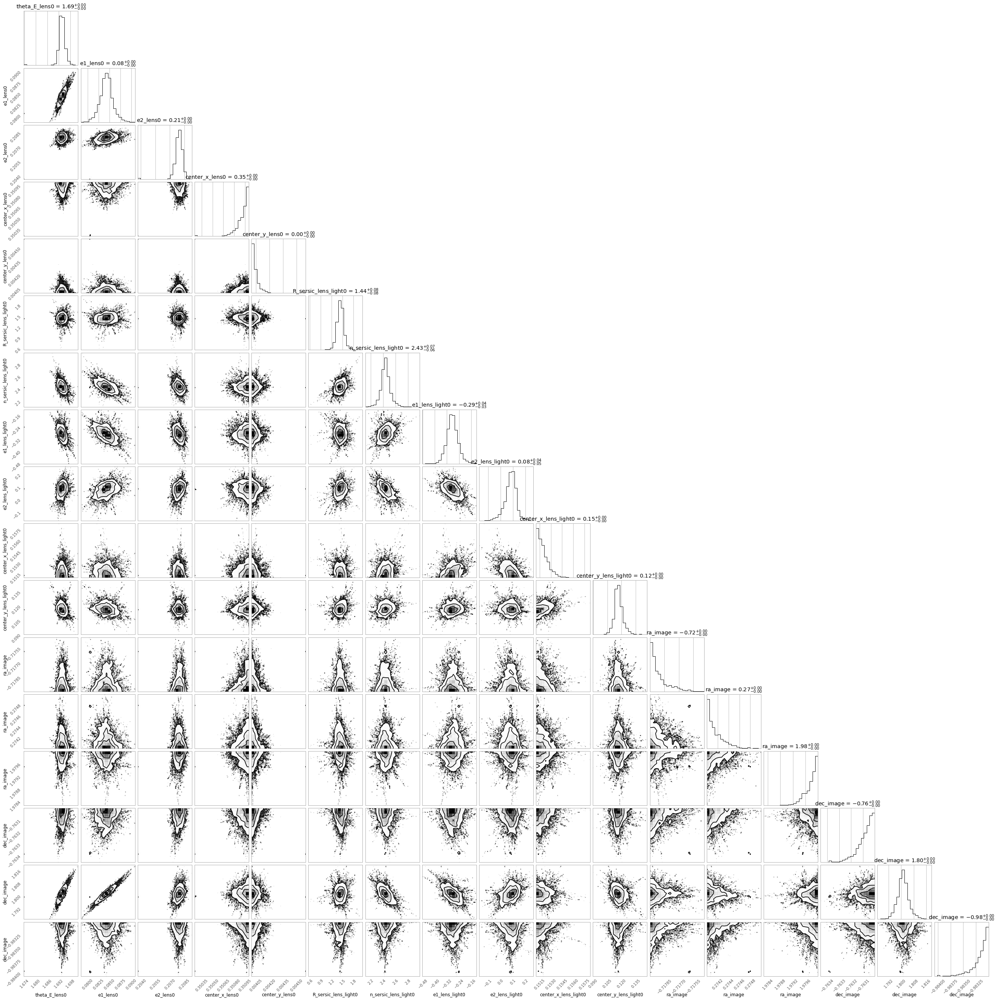

In [50]:
# DES_2915, coadd_id = 1400263522

# image positions, measured
x_images = [-0.618, 0.374, 1.88]
y_images = [-0.863, 1.795, -1.083]

# lens position
center_x = 0.251
center_y = 0.104

# initial guesses for params
theta_E = approx_theta_E(center_x, center_y, x_images, y_images)
kwargs_lens_initial = {'theta_E': theta_E, 'e1': 0., 'e2': 0.,
                       'center_x': center_x, 'center_y': center_y}
kwargs_light_initial = {'R_sersic': 1, 'n_sersic': 2, 'e1': 0., 'e2': 0.,
                        'center_x': center_x, 'center_y': center_y}

# run model with memory tracker
mem_usage = memory_usage((model, (1400263522,
                                  kwargs_lens_initial,
                                  kwargs_light_initial,
                                  x_images, y_images,
                                  psf_type), ))

print(f"Total Memory Usage: {mem_usage[-1]}")
print("================================================================")

### Summary: 
* PIXEL psf model
* center lens position free within +- 0.1 arcsec
* bounds for image positions is +- 0.1 arcsec
* PSO did not converge
    * 600 particles, 600 iterations
    * time taken = 19 min
* MCMC: 
    * 200 burn, 600 run
    * time taken = 8 min
    * num of free params: 17
* total memory: 715
* total time: 27 min

In [45]:
psf_type = 'GAUSSIAN'

'Estimated theta_E': 2.06
Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
Max iteration reached! Stopping.
-3.621941602838618 reduced X^2 of best position
-11443.524494168614 logL
6319.0 effective number of data points
[{'theta_E': 2.104282821698586, 'e1': -0.02270889940110737, 'e2': 0.026573740776229884, 'center_x': 1.583864117401398, 'center_y': -1.2310000078040142}] lens result
[] source result
[{'amp': 1, 'R_sersic': 2.0946055359593285, 'n_sersic': 4.999998770508849, 'e1': 0.11223662208089218, 'e2': -0.15625419674006788, 'center_x': 1.58000007572452, 'center_y': -1.4309997569685375}] lens light result
[{'ra_image': array([-1.59999970e-02, -9.99955555e-04,  3.63019382e+00]), 'dec_image': array([ 0.10100001, -2.54199986, -1.97744861]), 'point_amp': array([1., 1., 1.])}] point source

100%|█████████████████████████████████████████| 800/800 [07:24<00:00,  1.80it/s]

Computing the MCMC...
Number of walkers =  170
Burn-in iterations:  200
Sampling iterations (in current run): 800
445.11383509635925 time taken for MCMC sampling
-3.6053234591832393 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  7.609134989510474
reduced chi^2 of data  1 =  2.670895850546862
reduced chi^2 of data  2 =  0.5359395374923818


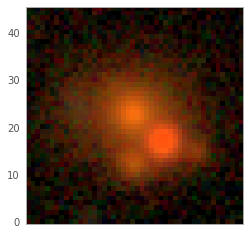

/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',


number of non-linear parameters in the MCMC process:  17
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'ra_image', 'dec_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  102000
102000


Measured Positions: 
center: (1.68, -1.331)
ra_images: [0.068, 0.099, 3.623] 
dec_images: [0.201, -2.442, -1.878]
Result Positions: 
center: (1.58, -1.23)
ra_images: [-0.02 -0.    3.64]
dec_images: [ 0.1  -2.54 -1.98]
Total Memory Usage: 789.3671875


<Figure size 648x648 with 0 Axes>

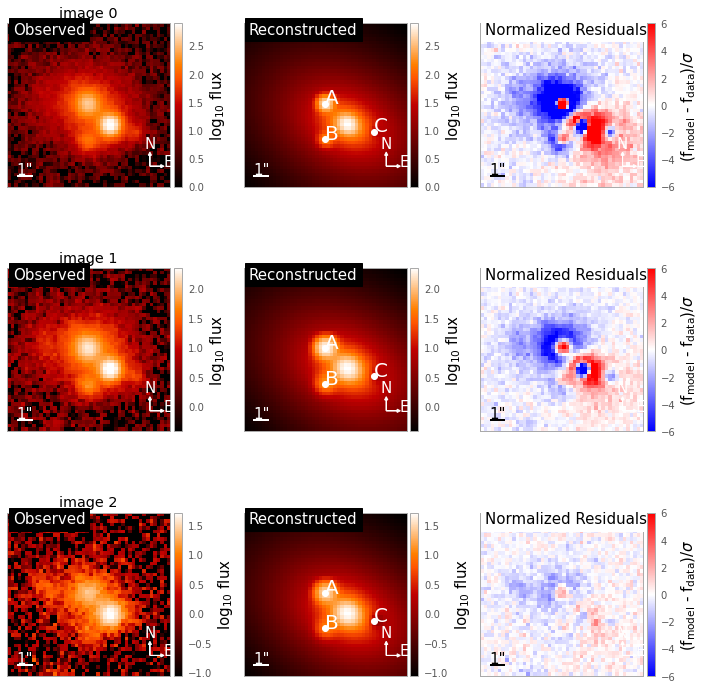

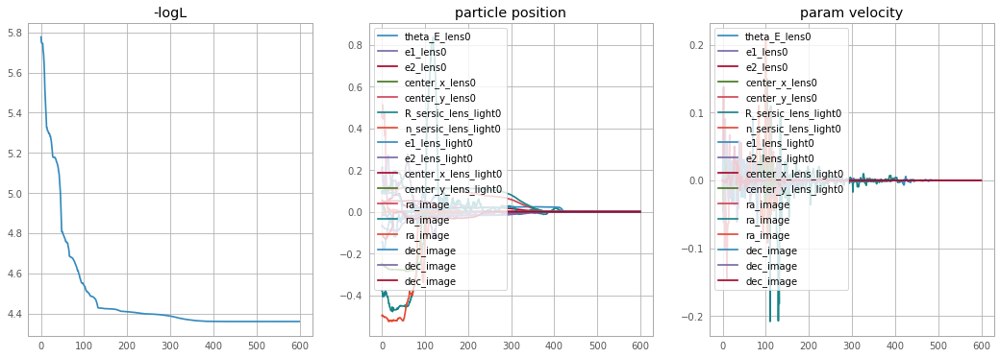

<Figure size 432x288 with 0 Axes>

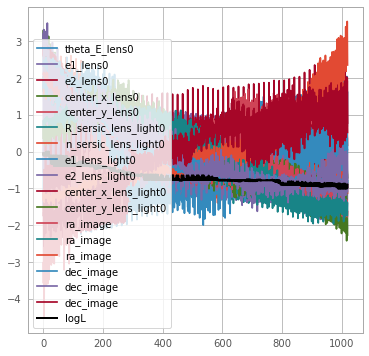

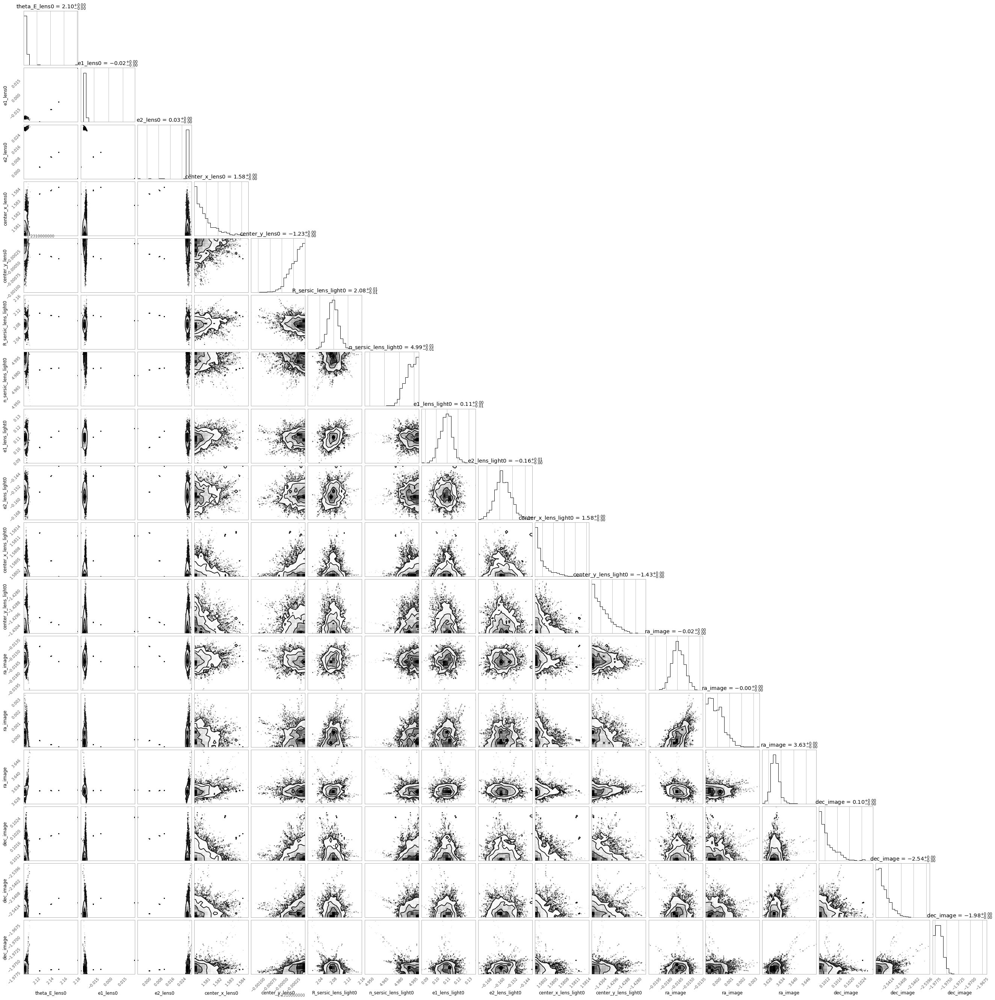

In [46]:
# DES_4414, coadd_id = 1087262176

# lens position:
center_x = 1.68
center_y = -1.331

# image positions, measured
x_images = [0.068, 0.099, 3.623]
y_images = [0.201, -2.442, -1.878]

# initial guesses for params
theta_E = approx_theta_E(center_x, center_y, x_images, y_images)

kwargs_lens_initial = {'theta_E': theta_E, 'e1': 0., 'e2': 0,
                       'center_x': center_x, 'center_y': center_y}
kwargs_light_initial = {'R_sersic': 1, 'n_sersic': 2, 'e1': 0,
                        'e2': 0, 'center_x': center_x, 'center_y': center_y}

# run model with memory tracker
mem_usage = memory_usage((model, (1087262176,
                                  kwargs_lens_initial,
                                  kwargs_light_initial,
                                  x_images, y_images,
                                  psf_type), ))

print(f"Total Memory Usage: {mem_usage[-1]}")
print("================================================================")

### Summary: 
* GAUSSIAN psf model
* lens mass and light position vary within +-0.1 arcsec
* image positions vary for image positions is +- 0.1 arcsec
* PSO did not converge
    * 600 particles, 600 iterations
    * time taken = 11 min
* MCMC: 
    * 200 burn, 600 run, 10 walkerRatio
    * time taken = 7.5 min
    * num of free params: 17
* total memory: 790
* total time: 18.5 min

'Estimated theta_E': 1.67
Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
Max iteration reached! Stopping.
-3.316319917120768 reduced X^2 of best position
-10477.912778143065 logL
6319.0 effective number of data points
[{'theta_E': 1.6944463912915801, 'e1': 0.08446600310306963, 'e2': 0.20769587469213274, 'center_x': 0.35099998103554764, 'center_y': 0.004000250655525831}] lens result
[] source result
[{'amp': 1, 'R_sersic': 1.5664229660699054, 'n_sersic': 2.007412304245695, 'e1': -0.1623649146497091, 'e2': -0.001472975750402529, 'center_x': 0.2670946086775688, 'center_y': 0.004250450202185554}] lens light result
[{'ra_image': array([-0.71799981,  0.27400016,  1.97999968]), 'dec_image': array([-0.76300003,  1.80160462, -0.98300003]), 'point_amp': array([1., 1., 1.])}] point source resul

100%|█████████████████████████████████████████| 800/800 [06:38<00:00,  2.01it/s]

Computing the MCMC...
Number of walkers =  170
Burn-in iterations:  200
Sampling iterations (in current run): 800
399.68912410736084 time taken for MCMC sampling
-0.38542651331664535 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.46409452939074747
reduced chi^2 of data  1 =  0.2537870170117499
reduced chi^2 of data  2 =  0.4383979935474387


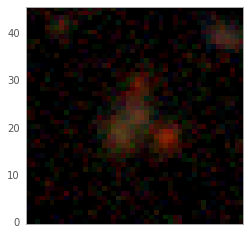

/Users/gilliancartwright/miniconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',


number of non-linear parameters in the MCMC process:  17
parameters in order:  ['theta_E_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'R_sersic_lens_light0', 'n_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'ra_image', 'ra_image', 'ra_image', 'dec_image', 'dec_image', 'dec_image']
number of evaluations in the MCMC process:  102000
102000
Measured Positions: 
center: (0.251, 0.104)
ra_images: [-0.618, 0.374, 1.88] 
dec_images: [-0.863, 1.795, -1.083]
Result Positions: 
center: (0.35, 0.0)
ra_images: [-0.72  0.27  1.98]
dec_images: [-0.76  1.81 -0.98]
Total Memory Usage: 789.75


<Figure size 648x648 with 0 Axes>

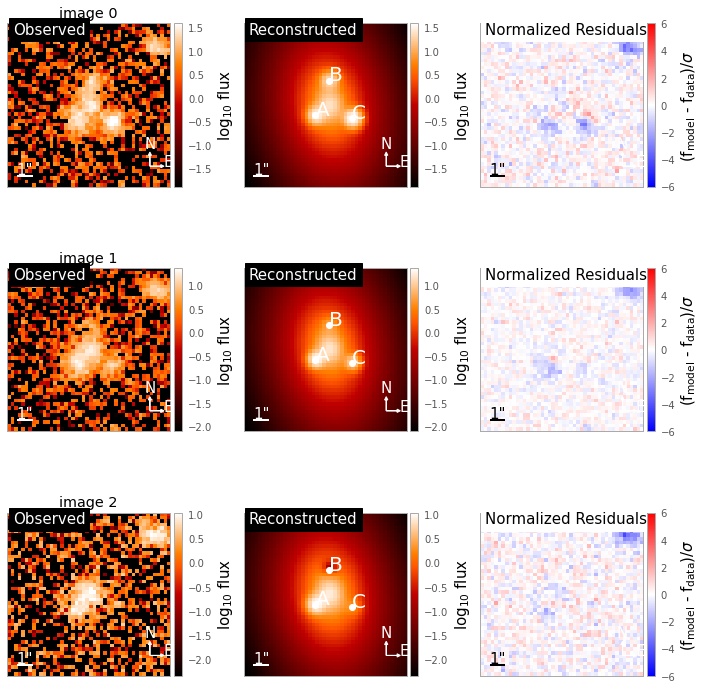

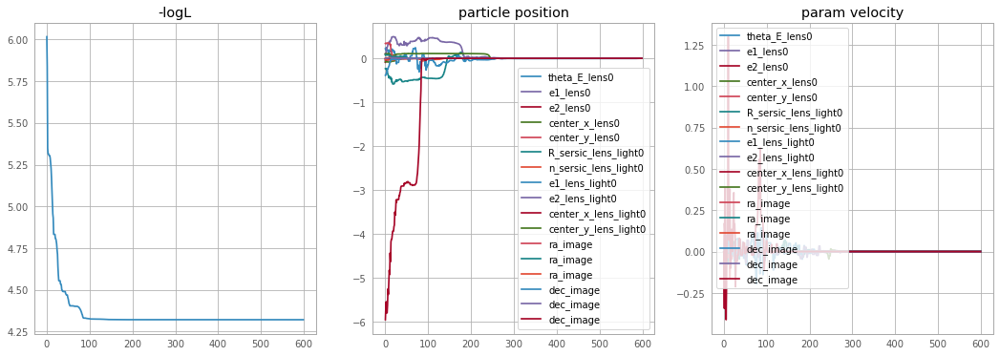

<Figure size 432x288 with 0 Axes>

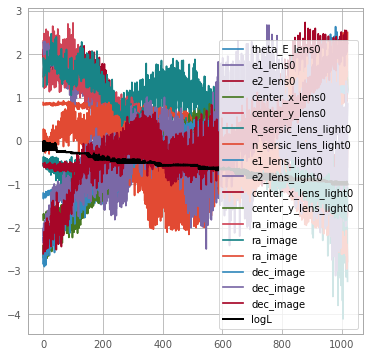

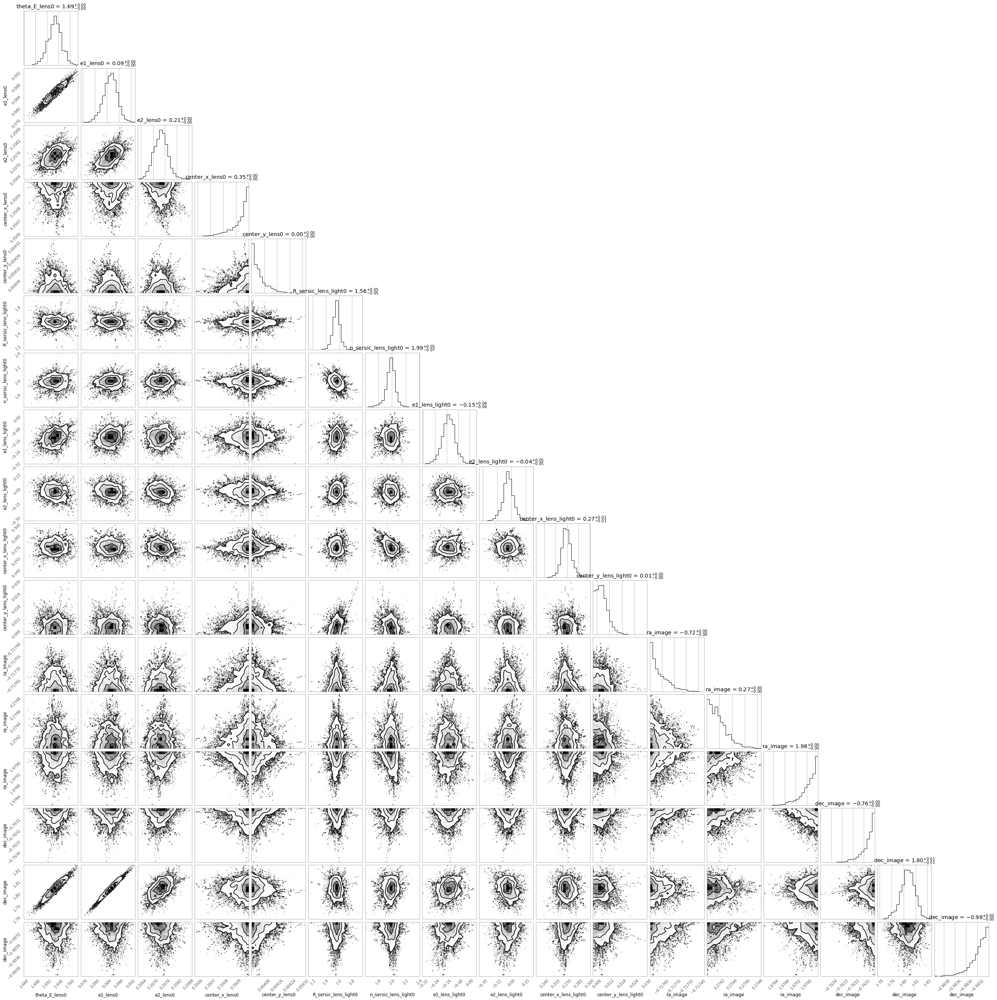

In [47]:
# DES_2915, coadd_id = 1400263522

# image positions, measured
x_images = [-0.618, 0.374, 1.88]
y_images = [-0.863, 1.795, -1.083]

# lens position
center_x = 0.251
center_y = 0.104

# initial guesses for params
theta_E = approx_theta_E(center_x, center_y, x_images, y_images)
kwargs_lens_initial = {'theta_E': theta_E, 'e1': 0., 'e2': 0.,
                       'center_x': center_x, 'center_y': center_y}
kwargs_light_initial = {'R_sersic': 1, 'n_sersic': 2, 'e1': 0., 'e2': 0.,
                        'center_x': center_x, 'center_y': center_y}

# run model with memory tracker
mem_usage = memory_usage((model, (1400263522,
                                  kwargs_lens_initial,
                                  kwargs_light_initial,
                                  x_images, y_images,
                                  psf_type), ))

print(f"Total Memory Usage: {mem_usage[-1]}")
print("================================================================")

### Summary: 
* GAUSSIAN psf model
* lens mass and light position vary within +-0.1 arcsec
* image positions vary for image positions is +- 0.1 arcsec
* PSO did not converge
    * 600 particles, 600 iterations
    * time taken = 19 min
* MCMC: 
    * 200 burn, 600 run, 10 walkerRatio
    * time taken = 6.5 min
    * num of free params: 17
* total memory: 790
* total time: 25.5 min